<a href="https://colab.research.google.com/github/filnels/Homeworks/blob/main/Pandas_Visualisation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# Matplotlib forms basis for visualization in Python
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
# We will use the Seaborn library
import seaborn as sns

sns.set()

# Graphics in SVG format are more sharp and legible
%config InlineBackend.figure_format = 'svg'

In [ ]:
# Загрузка данных
player_data = pd.read_csv('player_data.csv')
players = pd.read_csv('Players.csv')
seasons_stats = pd.read_csv('Seasons_Stats.csv')
#  Проверка названий столбцов
print(seasons_stats.columns)
print(player_data.columns)
print(players.columns)

Index(['Unnamed: 0', 'Year', 'Player', 'Pos', 'Age', 'Tm', 'G', 'GS', 'MP',
       'PER', 'TS%', '3PAr', 'FTr', 'ORB%', 'DRB%', 'TRB%', 'AST%', 'STL%',
       'BLK%', 'TOV%', 'USG%', 'blanl', 'OWS', 'DWS', 'WS', 'WS/48', 'blank2',
       'OBPM', 'DBPM', 'BPM', 'VORP', 'FG', 'FGA', 'FG%', '3P', '3PA', '3P%',
       '2P', '2PA', '2P%', 'eFG%', 'FT', 'FTA', 'FT%', 'ORB', 'DRB', 'TRB',
       'AST', 'STL', 'BLK', 'TOV', 'PF', 'PTS'],
      dtype='object')
Index(['name', 'year_start', 'year_end', 'position', 'height', 'weight',
       'birth_date', 'college'],
      dtype='object')
Index(['Unnamed: 0', 'Player', 'height', 'weight', 'collage', 'born',
       'birth_city', 'birth_state'],
      dtype='object')


In [ ]:
player_data.head()

,name,year_start,year_end,position,height,weight,birth_date,college
0,Alaa Abdelnaby,1991,1995,F-C,6-10,240.0,"June 24, 1968",Duke University
1,Zaid Abdul-Aziz,1969,1978,C-F,6-9,235.0,"April 7, 1946",Iowa State University
2,Kareem Abdul-Jabbar,1970,1989,C,7-2,225.0,"April 16, 1947","University of California, Los Angeles"
3,Mahmoud Abdul-Rauf,1991,2001,G,6-1,162.0,"March 9, 1969",Louisiana State University
4,Tariq Abdul-Wahad,1998,2003,F,6-6,223.0,"November 3, 1974",San Jose State University


In [ ]:

# Функция для перевода футов и дюймов в метры
def feet_to_meters(feet_inches):
    # Проверяем, что значение не является NaN или некорректным
    if pd.isna(feet_inches) or feet_inches.lower() == 'nan':
        return None  # Возвращаем None для пропущенных или некорректных значений

    # Преобразуем значение в строку
    feet_inches = str(feet_inches)

    # Проверяем, содержит ли значение тире (например, "6-4")
    if '-' in feet_inches:
        feet, inches = feet_inches.split('-')
        feet = int(feet)  # Преобразуем футы в целое число
        inches = int(inches)  # Преобразуем дюймы в целое число
    else:
        # Если тире нет, предполагаем, что это только футы
        feet = int(feet_inches)
        inches = 0  # Дюймов нет

    # Переводим в метры (1 фут = 0.3048 м, 1 дюйм = 0.0254 м)
    total_meters = round(feet * 0.3048 + inches * 0.0254,2)
    return total_meters

# Преобразуем все значения в столбце 'height' в строки
player_data['height'] = player_data['height'].astype(str)

# Применяем функцию ко всему столбцу 'height'
player_data['height_meters'] = player_data['height'].apply(feet_to_meters)


print(player_data[['height', 'height_meters']].head())

  height  height_meters
0   6-10           2.08
1    6-9           2.06
2    7-2           2.18
3    6-1           1.85
4    6-6           1.98


In [ ]:
# Преобразуем  height_meters с типом object в float
player_data['height_meters'] = pd.to_numeric(player_data['height_meters'], errors='coerce')

print(player_data['height_meters'].dtypes)

float64


In [ ]:
# Создаем столбец опыта игрока
player_data['experience'] = player_data['year_end'] - player_data['year_start']

In [ ]:
def pounds_to_kg(pounds):
    return round(pounds * 0.453592,0)

# Применяем функцию ко всему столбцу 'weight' (в фунтах)
player_data['weight_kg'] = player_data['weight'].apply(pounds_to_kg)

# Просматриваем первые строки с новым столбцом
print(player_data[['weight', 'weight_kg']].head())

   weight  weight_kg
0   240.0      109.0
1   235.0      107.0
2   225.0      102.0
3   162.0       73.0
4   223.0      101.0


In [ ]:
# Удаление столбцов с названием Unnamed
player_data = player_data.loc[:, ~player_data.columns.str.contains('^Unnamed')]
players = players.loc[:, ~players.columns.str.contains('^Unnamed')]
seasons_stats = seasons_stats.loc[:, ~seasons_stats.columns.str.contains('^Unnamed')]

# Объединение данных
merged_data = pd.merge(seasons_stats, player_data, left_on='Player', right_on='name')

# Удаление одного из повторяющихся столбцов с именем игрока
merged_data = merged_data.drop(columns=['name'])

filtered_merged_data = merged_data_all[['height_meters', 'weight_kg', 'BLK%', 'PTS', 'PER']].dropna()

print(filtered_merged_data.head())


      height_meters  weight_kg  BLK%     PTS   PER
3134           2.06      107.0   2.3   865.0  15.9
3135           1.98       95.0   0.3   759.0  10.9
3136           1.85       79.0   0.1   182.0  10.0
3137           1.88       79.0   0.5  1268.0  18.8
3138           2.08      107.0   1.0   184.0  11.4


In [ ]:
filtered_merged_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 20327 entries, 3134 to 23467
Data columns (total 5 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   height_meters  20327 non-null  float64
 1   weight_kg      20327 non-null  float64
 2   BLK%           20327 non-null  float64
 3   PTS            20327 non-null  float64
 4   PER            20327 non-null  float64
dtypes: float64(5)
memory usage: 952.8 KB


In [ ]:
#  зависимость роста и очков
plt.figure(figsize=(10, 6))
sns.scatterplot(x='height_meters', y='PTS', data=filtered_merged_data, s=60)
plt.title('Зависимость роста и очков')
plt.xlabel('Height (Рост)')
plt.ylabel('Points (Очки)')
plt.xticks(rotation=45)
plt.savefig('Points_height.png')
plt.show()



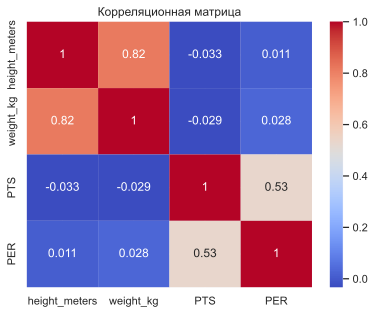

In [ ]:
# корреляционная матрица
corr_matrix = merged_data[['height_meters', 'weight_kg', 'PTS', 'PER']].corr()
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')
plt.title('Корреляционная матрица')
plt.savefig('Matrix_Correlation.png')
plt.show()

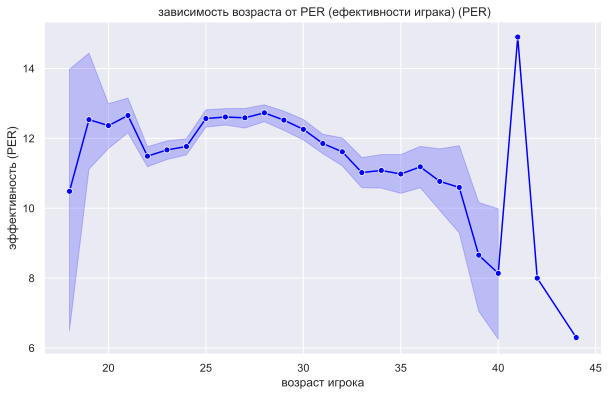

In [ ]:
# зависимость возраста от PER (ефективности играка)
plt.figure(figsize=(10, 6))
sns.lineplot(x='Age', y='PER', data=merged_data, marker='o', color='blue')
plt.title(' зависимость возраста от PER (ефективности играка) (PER)')
plt.xlabel('возраст игрока')
plt.ylabel('эффективность (PER)')
plt.savefig('Age_PER.png')
plt.show()

In [ ]:
# Объединение данных 3 таблиц
merged_data_all = pd.merge(merged_data, players, left_on='Player', right_on='Player')

#Удаление  повторяющихся столбцов
merged_data_all = merged_data_all.drop(columns=['college'])


print(merged_data_all.head())

     Year           Player  Pos   Age   Tm     G  GS  MP  PER    TS%  ...  \
0  1950.0  Curly Armstrong  G-F  31.0  FTW  63.0 NaN NaN  NaN  0.368  ...   
1  1950.0     Cliff Barker   SG  29.0  INO  49.0 NaN NaN  NaN  0.435  ...   
2  1950.0    Leo Barnhorst   SF  25.0  CHS  67.0 NaN NaN  NaN  0.394  ...   
3  1950.0       Ed Bartels    F  24.0  TOT  15.0 NaN NaN  NaN  0.312  ...   
4  1950.0       Ed Bartels    F  24.0  DNN  13.0 NaN NaN  NaN  0.308  ...   

         birth_date  height_meters  experience  weight_kg  height_y  weight_y  \
0  November 1, 1918           1.80           2       77.0     180.0      77.0   
1  January 15, 1921           1.88           2       84.0     188.0      83.0   
2      May 11, 1924           1.93           4       86.0     193.0      86.0   
3   October 8, 1925           1.96           1       88.0     196.0      88.0   
4   October 8, 1925           1.96           1       88.0     196.0      88.0   

                           collage    born  birth_

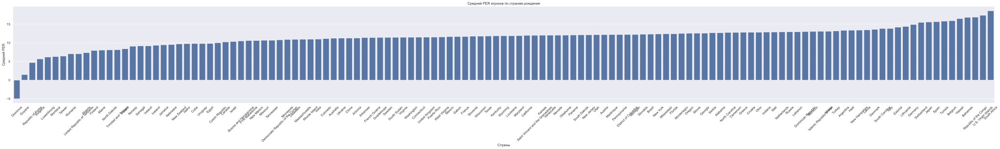

In [ ]:

# Группировка данных по странам рождения и расчет среднего PER для каждой страны
state_success = merged_data_all.groupby('birth_state')['PER'].mean().reset_index()

# Сортировка по возрастанию PER
state_success = state_success.sort_values(by='PER', ascending=True)

# Построение графика
plt.figure(figsize=(60, 6))

sns.barplot(x='birth_state', y='PER', data=state_success)
plt.title('Средний PER игроков по странам рождения')
plt.xlabel('Страны')
plt.ylabel('Средний PER')
plt.xticks(rotation=45)
plt.savefig('State_PER.png')
plt.show()


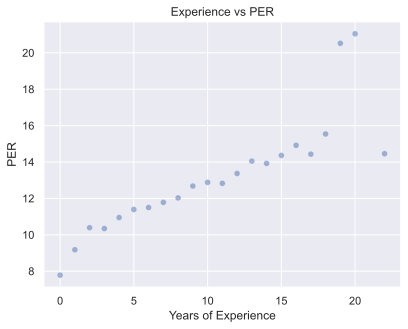

In [ ]:
# Анализ эффективности от опыта
experience_per = merged_data_all.groupby('experience')['PER'].mean().reset_index()

# График зависимости опыта от PER
sns.scatterplot( x='experience', y='PER', data = experience_per, alpha=0.5)
plt.title('Experience vs PER')
plt.xlabel('Years of Experience')
plt.ylabel('PER')
plt.savefig('experience_PER.png')
plt.show()

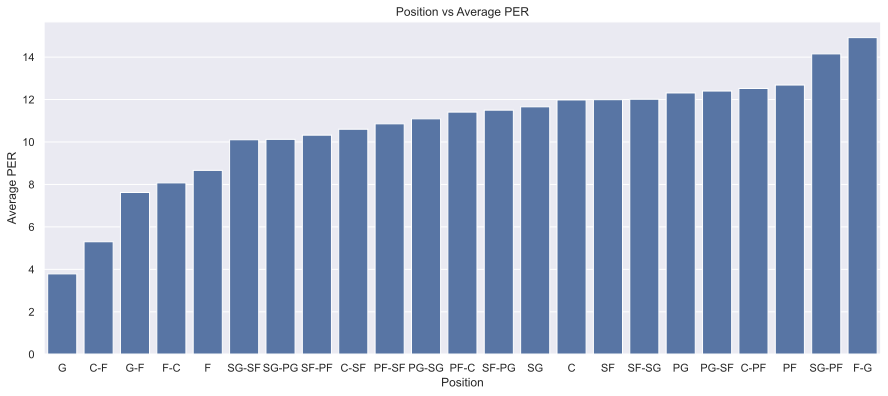

In [ ]:
# Группируем по позиции и считаем средний PER
position_per = merged_data_all.groupby('Pos')['PER'].mean().reset_index()
# Сортировка по возрастанию PER
position_per = position_per.sort_values(by='PER', ascending=True)
plt.figure(figsize=(15, 6))
# График зависимости позиции от PER
sns.barplot(data=position_per, x='Pos', y='PER')
plt.title('Position vs Average PER')
plt.xlabel('Position')
plt.ylabel('Average PER')
plt.savefig('Position_PER.png')
plt.show()

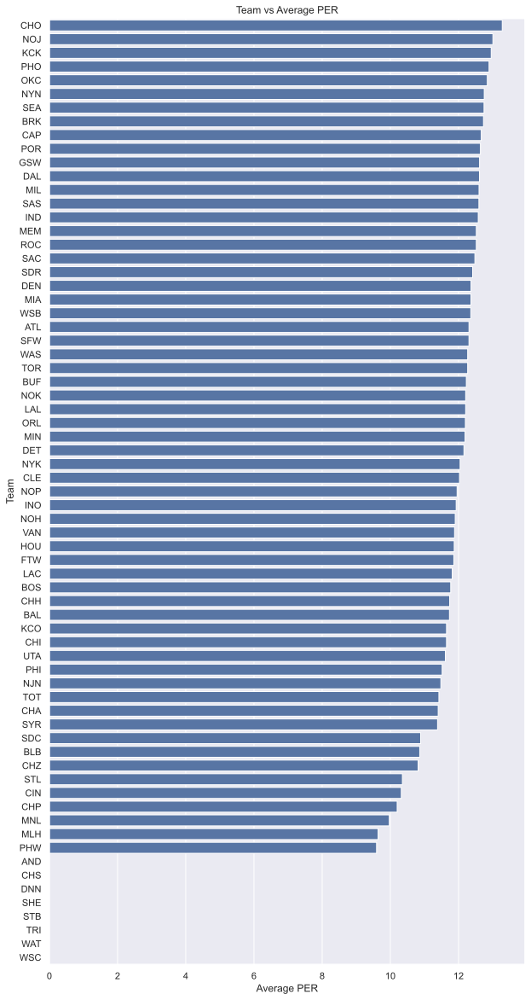

In [ ]:
# Группируем по команде и считаем средний PER
team_per = merged_data_all.groupby('Tm')['PER'].mean().reset_index()

# Сортируем по PER
team_per_sorted = team_per.sort_values('PER', ascending=False)

plt.figure(figsize=(10, 20))
sns.barplot(data=team_per_sorted, x='PER', y='Tm')
plt.title('Team vs Average PER')
plt.xlabel('Average PER')
plt.ylabel('Team')
plt.savefig('Team_PER.png')
plt.show()

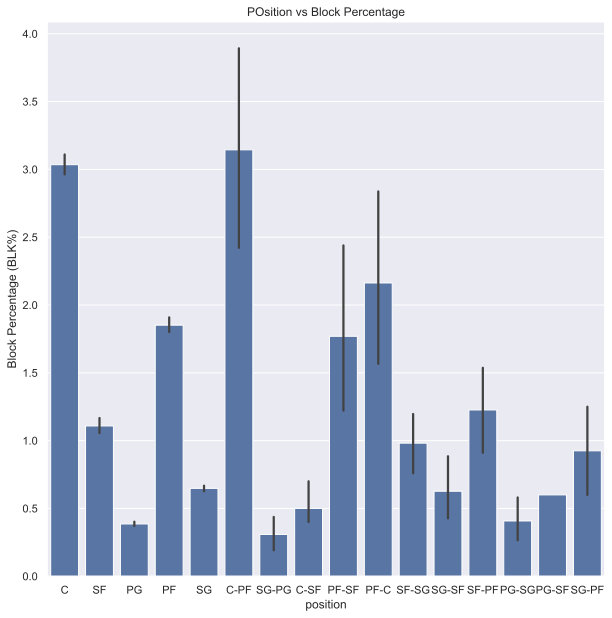

In [ ]:

filtered_data = merged_data_all[['height_meters', 'weight_kg', 'BLK%', 'Pos']].dropna()

# Строим график для веса и процента блоков
sns.scatterplot(data=filtered_data, x='weight_kg', y='BLK%', alpha=0.5)
plt.title('Weight vs Block Percentage')
plt.xlabel('Weight (kg)')
plt.ylabel('Block Percentage (BLK%)')
plt.savefig('Weight_BLK%.png')
plt.show()

# Строим график для роста и процента блоков
sns.scatterplot(data=filtered_data, x='height_meters', y='BLK%', alpha=0.5)
plt.title('Height vs Block Percentage')
plt.xlabel('Height (cm)')
plt.ylabel('Block Percentage (BLK%)')
plt.savefig('Height_BLK%.png')
plt.show()

# Строим график для позиции игрока и процента блоков
plt.figure(figsize=(10, 10))
sns.barplot(data=filtered_data, x='Pos', y='BLK%')
plt.title('POsition vs Block Percentage')
plt.xlabel('position')
plt.ylabel('Block Percentage (BLK%)')
plt.savefig('Position_BLK%.png')
plt.show()



In [ ]:
merged_data_all.head()


,Year,Player,Pos,Age,Tm,G,GS,MP,PER,TS%,...,birth_date,height_meters,experience,weight_kg,height_y,weight_y,collage,born,birth_city,birth_state
0,1950.0,Curly Armstrong,G-F,31.0,FTW,63.0,NaN,NaN,NaN,0.368,...,"November 1, 1918",1.80,2,77.0,180.0,77.0,Indiana University,1918.0,NaN,NaN
1,1950.0,Cliff Barker,SG,29.0,INO,49.0,NaN,NaN,NaN,0.435,...,"January 15, 1921",1.88,2,84.0,188.0,83.0,University of Kentucky,1921.0,Yorktown,Indiana
2,1950.0,Leo Barnhorst,SF,25.0,CHS,67.0,NaN,NaN,NaN,0.394,...,"May 11, 1924",1.93,4,86.0,193.0,86.0,University of Notre Dame,1924.0,NaN,NaN
3,1950.0,Ed Bartels,F,24.0,TOT,15.0,NaN,NaN,NaN,0.312,...,"October 8, 1925",1.96,1,88.0,196.0,88.0,North Carolina State University,1925.0,NaN,NaN
4,1950.0,Ed Bartels,F,24.0,DNN,13.0,NaN,NaN,NaN,0.308,...,"October 8, 1925",1.96,1,88.0,196.0,88.0,North Carolina State University,1925.0,NaN,NaN


In [ ]:

# Преобразование столбца birth_date в формат datetime
merged_data_all['birth_date'] = pd.to_datetime(merged_data_all['birth_date'], format='%B %d, %Y')

# Извлечение месяца в виде строки
merged_data_all['month'] = merged_data_all['birth_date'].dt.strftime('%B')

print(merged_data_all[['birth_date', 'month']])


      birth_date      month
0     1918-11-01   November
1     1921-01-15    January
2     1924-05-11        May
3     1925-10-08    October
4     1925-10-08    October
...          ...        ...
23463 1992-10-05    October
23464 1990-01-17    January
23465 1996-09-09  September
23466 1994-02-18   February
23467 1997-03-18      March

[23468 rows x 2 columns]


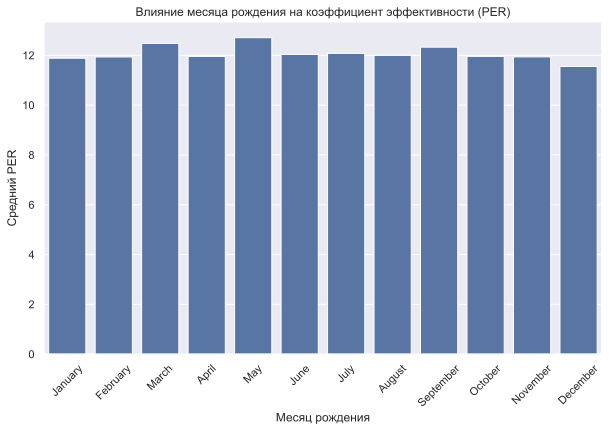

In [ ]:
# Группировка данных по месяцу и расчет среднего PER
month_per = merged_data_all.groupby('month')['PER'].mean().reset_index()

# Порядок месяцев
months_order = ['January', 'February', 'March', 'April', 'May', 'June',
                'July', 'August', 'September', 'October', 'November', 'December']


plt.figure(figsize=(10, 6))
sns.barplot(x='month', y='PER', data=month_per, order=months_order)
plt.title('Влияние месяца рождения на коэффициент эффективности (PER)')
plt.xlabel('Месяц рождения')
plt.ylabel('Средний PER')
plt.xticks(rotation=45)
plt.savefig('Month_Birth_PER.png')
plt.show()

In [ ]:
merged_data_all['BMI'] = merged_data_all['weight_kg'] / (merged_data_all['height_meters']) ** 2
BMI_per = merged_data_all.groupby('BMI')['PER'].mean().reset_index()

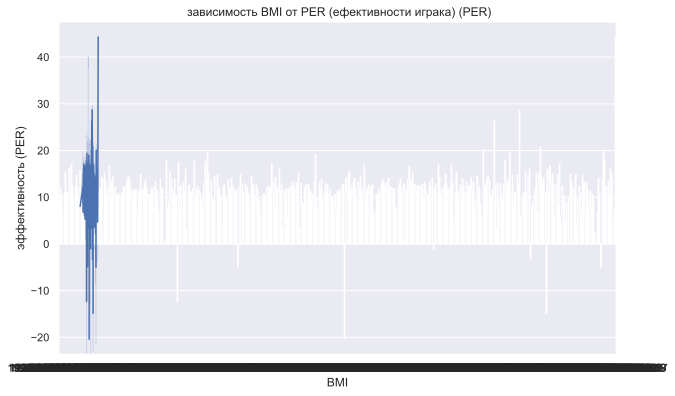

In [ ]:
# зависимость BMI от PER (ефективности играка)    здесь вопрос, непонятно, что нужно сделать, чтоб график хорошо отображался!
plt.figure(figsize=(10, 6))
sns.lineplot(x="BMI", y='PER', data=merged_data_all);
sns.barplot(x='BMI', y='PER', data=BMI_per)
plt.title(' зависимость BMI от PER (ефективности играка) (PER)')
plt.xlabel('BMI')
plt.ylabel('эффективность (PER)')
plt.savefig('BMI_PER.png')
plt.show()


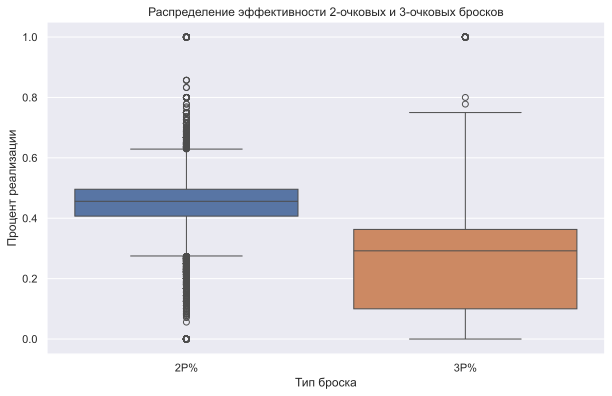

In [ ]:
# график эффективности двухочковых и трехочковых бросков
plt.figure(figsize=(10, 6))

sns.boxplot(data=seasons_stats[['2P%', '3P%']])

plt.title('Распределение эффективности 2-очковых и 3-очковых бросков')
plt.xlabel('Тип броска')
plt.ylabel('Процент реализации')
plt.savefig('2P_3P.png')
plt.show()